In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import scipy.stats as st
import plotly.express as px

In [86]:
df = pd.read_csv('vehicles_us.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


In [3]:
display(df.isna().sum() / len(df) * 100)
"The above represents the percent of null values in each dataframe field."

price            0.000000
model_year       7.023775
model            0.000000
condition        0.000000
cylinders       10.208637
fuel             0.000000
odometer        15.316836
transmission     0.000000
type             0.000000
paint_color     17.985444
is_4wd          50.369723
date_posted      0.000000
days_listed      0.000000
dtype: float64

'The above represents the percent of null values in each dataframe field.'

In [4]:
df.duplicated().sum()

0

In [5]:
df.sample(10)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
44813,1500,1997.0,chevrolet camaro,good,6.0,gas,NaN,manual,coupe,green,NaN,2019-01-16,58
13797,10995,2015.0,kia soul,excellent,4.0,gas,87000.0,automatic,sedan,brown,NaN,2018-11-19,19
6037,6995,2011.0,volkswagen jetta,good,5.0,gas,NaN,automatic,sedan,grey,NaN,2019-03-03,84
6632,1800,2005.0,dodge dakota,fair,NaN,gas,212000.0,automatic,truck,silver,1.0,2018-09-23,41
17703,6250,2015.0,hyundai sonata,good,4.0,gas,95167.0,automatic,sedan,white,NaN,2018-05-20,39
50380,27995,2013.0,chevrolet silverado 2500hd,like new,8.0,diesel,157241.0,automatic,truck,white,1.0,2019-01-14,10
35235,18500,2013.0,ram 1500,excellent,8.0,gas,49250.0,automatic,pickup,NaN,1.0,2019-03-25,58
22216,9999,2013.0,nissan altima,good,4.0,gas,76677.0,automatic,coupe,silver,NaN,2018-06-23,49
896,7250,2010.0,dodge grand caravan,excellent,NaN,gas,NaN,automatic,mini-van,black,NaN,2018-11-17,12
10005,10000,1997.0,ford f250 super duty,good,NaN,diesel,247000.0,automatic,truck,white,1.0,2018-06-06,40


In [6]:
df.describe()

,price,model_year,cylinders,odometer,is_4wd,days_listed
count,51525.000000,47906.000000,46265.000000,43633.000000,25572.0,51525.00000
mean,12132.464920,2009.750470,6.125235,115553.461738,1.0,39.55476
std,10040.803015,6.282065,1.660360,65094.611341,0.0,28.20427
min,1.000000,1908.000000,3.000000,0.000000,1.0,0.00000
25%,5000.000000,2006.000000,4.000000,70000.000000,1.0,19.00000
50%,9000.000000,2011.000000,6.000000,113000.000000,1.0,33.00000
75%,16839.000000,2014.000000,8.000000,155000.000000,1.0,53.00000
max,375000.000000,2019.000000,12.000000,990000.000000,1.0,271.00000


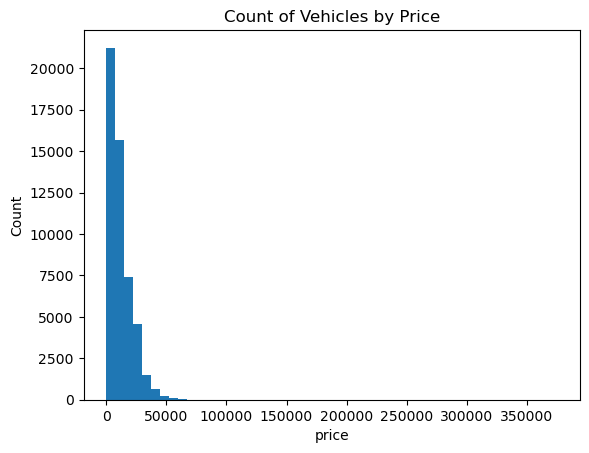

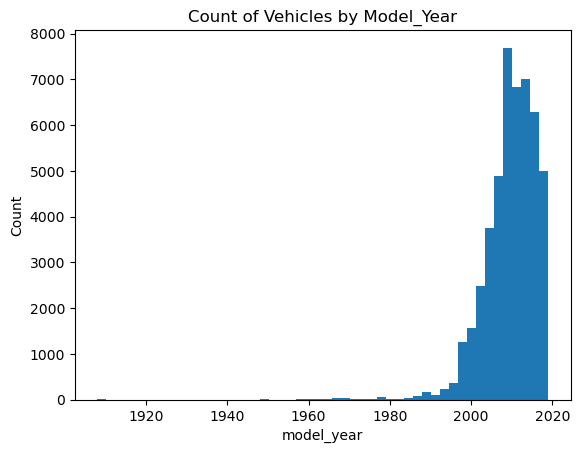

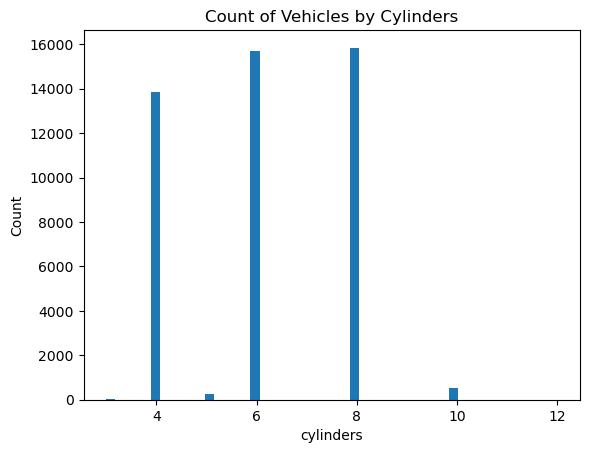

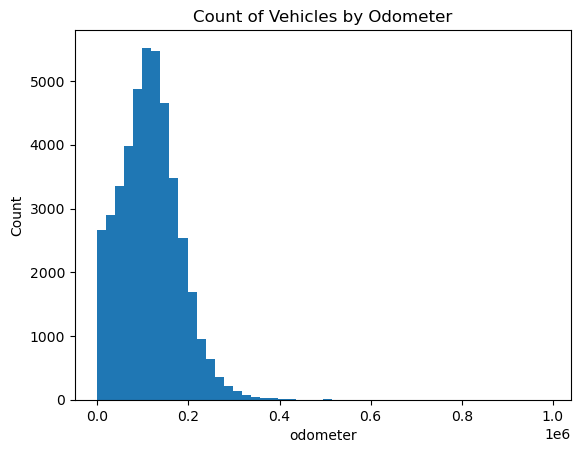

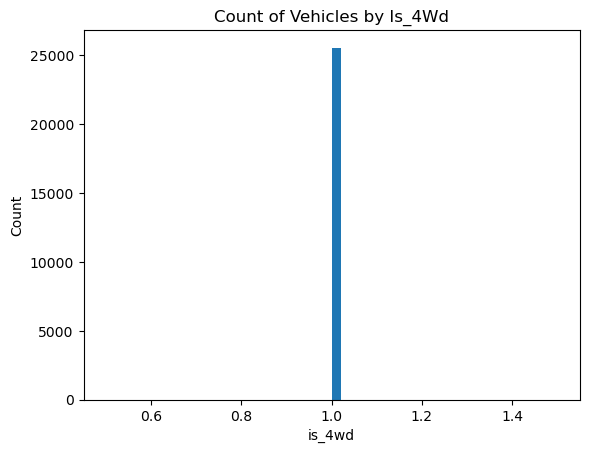

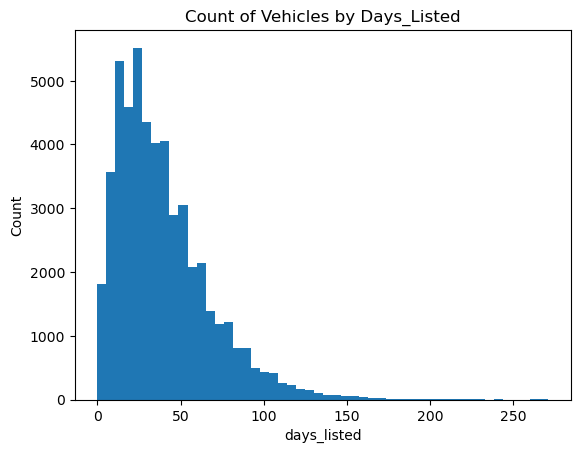

In [81]:
column_list = df.columns.to_list()
for i in column_list:
    try:
        df[i].plot(kind='hist', xlabel=f'{i}', ylabel='Count', x=f'{i}', title=f'Count of Vehicles by {i.title()}', bins=50)
        plt.show()
    except:
       pass

In [9]:
for i in column_list:
    print(f"The number of unique values for the {i} field: {df[i].nunique()}")
    display(df[i].value_counts().head(10))
    print('- - - - - - - - - - - - - - -')

The number of unique values for the price field: 3443


price
1       798
6995    719
5995    655
4995    624
3500    620
7995    616
5500    615
4500    608
8995    549
6500    528
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the model_year field: 68


model_year
2013.0    3549
2012.0    3468
2014.0    3448
2011.0    3375
2015.0    3323
2016.0    2954
2008.0    2924
2010.0    2691
2007.0    2643
2017.0    2419
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the model field: 100


model
ford f-150                    2796
chevrolet silverado 1500      2171
ram 1500                      1750
chevrolet silverado           1271
jeep wrangler                 1119
ram 2500                      1091
toyota camry                   990
honda accord                   964
chevrolet silverado 2500hd     915
gmc sierra 1500                906
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the condition field: 6


condition
excellent    24773
good         20145
like new      4742
fair          1607
new            143
salvage        115
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the cylinders field: 7


cylinders
8.0     15844
6.0     15700
4.0     13864
10.0      549
5.0       272
3.0        34
12.0        2
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the fuel field: 5


fuel
gas         47288
diesel       3714
hybrid        409
other         108
electric        6
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the odometer field: 17762


odometer
0.0         185
140000.0    183
120000.0    179
130000.0    178
160000.0    167
200000.0    166
180000.0    161
150000.0    160
170000.0    146
110000.0    121
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the transmission field: 3


transmission
automatic    46902
manual        2829
other         1794
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the type field: 13


type
SUV            12405
truck          12353
sedan          12154
pickup          6988
coupe           2303
wagon           1541
mini-van        1161
hatchback       1047
van              633
convertible      446
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the paint_color field: 12


paint_color
white     10029
black      7692
silver     6244
grey       5037
blue       4475
red        4421
green      1396
brown      1223
custom     1153
yellow      255
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the is_4wd field: 1


is_4wd
1.0    25572
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the date_posted field: 354


date_posted
2019-03-17    186
2019-01-05    184
2018-09-20    178
2019-03-11    176
2018-10-09    174
2019-04-10    173
2018-08-05    173
2019-03-28    172
2018-05-23    171
2018-07-29    169
Name: count, dtype: int64

- - - - - - - - - - - - - - -
The number of unique values for the days_listed field: 227


days_listed
18    959
24    950
22    945
19    941
20    934
16    926
25    921
23    915
27    912
17    910
Name: count, dtype: int64

- - - - - - - - - - - - - - -


,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,manufacturer
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19,bmw
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50,ford
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79,hyundai
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9,ford
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28,chrysler
5,14990,2014.0,chrysler 300,excellent,6.0,gas,57954.0,automatic,sedan,black,1.0,2018-06-20,15,chrysler
6,12990,2015.0,toyota camry,excellent,4.0,gas,79212.0,automatic,sedan,white,NaN,2018-12-27,73,toyota
7,15990,2013.0,honda pilot,excellent,6.0,gas,109473.0,automatic,SUV,black,1.0,2019-01-07,68,honda
8,11500,2012.0,kia sorento,excellent,4.0,gas,104174.0,automatic,SUV,NaN,1.0,2018-07-16,19,kia
9,9200,2008.0,honda pilot,excellent,NaN,gas,147191.0,automatic,SUV,blue,1.0,2019-02-15,17,honda


<Axes: title={'center': 'Count of Vehicles by Manufacturer'}, xlabel='manufacturer', ylabel='Count'>

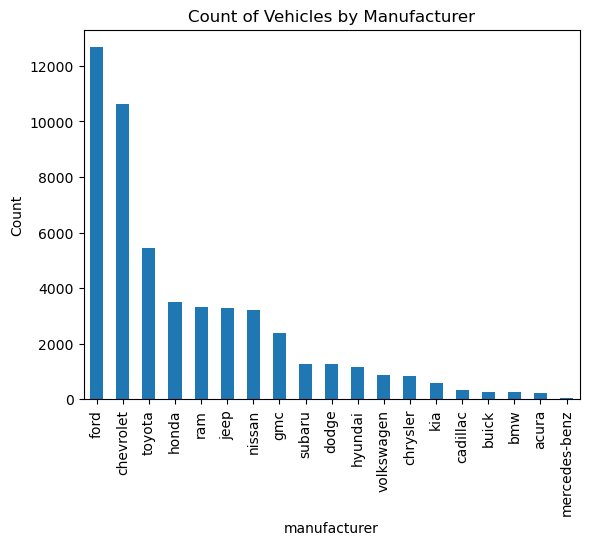

In [83]:
new = df['model'].str.split(" ", n=1, expand=True)
df['manufacturer'] = new[0]
display(df.head(15))
df['manufacturer'].value_counts().plot(kind='bar', x='manufacturer', ylabel = 'Count', xlabel='manufacturer', title='Count of Vehicles by Manufacturer')

In [77]:
px.histogram(df, x='manufacturer', color='condition', title='Manufacturer of Car by Car Condition')

In [12]:
df['manufacturer'].nunique()

19

In [78]:
px.histogram(df, x='manufacturer', color='type', title='Count of Cars by Manufacturer by Car Type')

In [50]:
px.histogram(df, x='days_listed', color='manufacturer', title='Days Listed per Car per Manufacturer')

In [49]:
px.histogram(df, x='price', color='manufacturer', title='Price per Car per Manufacturer')

In [70]:
px.histogram(df, x='days_listed', color='type', title='Days Listed per Car per Type')

In [71]:
px.histogram(df, x='price', color='type', title='Price of Car per Type')

In [51]:
px.histogram(df, x='days_listed', color='condition', title='Days Listed per Car Condition')

In [52]:
px.scatter(df, x='days_listed', y='price', title='Days Listed vs Price of Car')

In [53]:
px.scatter(df, y='odometer', x='price', title='Odometer Mileage vs Car Price')

In [54]:
px.histogram(df, x='days_listed', color='paint_color', title='Days Listed by Paint-color of Car')

In [56]:
px.histogram(df, x='model_year', color='type', title="Count of Car's Model Year and Vehicle Type")

In [58]:
px.histogram(df, x='model_year', color='cylinders', title="Count of Car's Model Year and Cylinders")

In [73]:
px.histogram(df, x='model_year', color='condition', title='Model Year of Car by Condition')

In [74]:
px.histogram(df, x='type', color='transmission', title='Type of Car Car by Transmission')

In [76]:
px.histogram(df, x='days_listed', color='transmission', title='Days Listed by Car by Transmission')

In [84]:
px.histogram(df, x='model_year', color='paint_color', title='Model Year of Car by Paint Color')